Notebook for us to start working in. 

# PPOL 5203 Final Project

## 1. Import Data and Clean Columns

In [2]:
#!pip install openpyxl

In [494]:
import pandas as pd
import os
import openpyxl

In [279]:
#!pip install geopandas
#!pip install contextily

In [495]:
import geopandas as gpd
import os
import matplotlib.pyplot as plt
import contextily

In [496]:
pwd

'C:\\Users\\bsullivan\\OneDrive - FI Consulting\\Documents\\GU\\Data Science 1\\PPOL5203_FinalProject\\Datasets\\Clean_Data'

In [181]:
os.chdir("../")

In [183]:
os.chdir("../")

In [184]:
os.chdir('NRI_Shapefile_Counties')

In [284]:
shape_county = gpd.read_file('NRI_Shapefile_Counties.shp')

In [291]:
shape_county = shape_county[~shape_county.STATE.str.contains("American Samoa|Guam|Northern Mariana Islands|Virgin Islands|Puerto Rico")]
#shape_county.filter(columns = ["COUNTYFIPS", "geometry"])

In [285]:
os.chdir("../")
os.chdir("PPOL5203_FinalProject/Datasets/Clean_Data")

In [ ]:
prediction_data = pd.read_csv("NRI_county_health_data_predictions.csv")

In [497]:
prediction_data_southeast = pd.read_csv("southeast_prediction_data.csv")

In [505]:
prediction_data_southeast.query('Community_Type == "Urban"').count

<bound method DataFrame.count of         FIPS STATEABBRV     State               County  \
36    1073.0         AL   Alabama            Jefferson   
44    1089.0         AL   Alabama              Madison   
48    1097.0         AL   Alabama               Mobile   
67   12001.0         FL   Florida              Alachua   
71   12009.0         FL   Florida              Brevard   
..       ...        ...       ...                  ...   
764  51059.0         VA  Virginia              Fairfax   
778  51087.0         VA  Virginia              Henrico   
788  51107.0         VA  Virginia              Loudoun   
808  51153.0         VA  Virginia       Prince William   
865  51810.0         VA  Virginia  Virginia Beach City   

                County_State Community_Type  POPULATION         AREA  \
36             Jefferson, AL          Urban    673766.0  1135.498241   
44               Madison, AL          Urban    387825.0   820.919826   
48                Mobile, AL          Urban    414514.

In [380]:
shape_county.head()

,NRI_ID,STATE,STATEABBRV,STATEFIPS,COUNTY,COUNTYTYPE,COUNTYFIPS,FIPS,POPULATION,BUILDVALUE,...,WNTW_ALRP,WNTW_ALRA,WNTW_ALR_N,WNTW_RISKV,WNTW_RISKS,WNTW_RISKR,NRI_VER,Shape_Leng,Shape_Area,geometry
0,C01001,Alabama,AL,01,Autauga,County,001,01001,58764,9.123274e+09,...,7.410082e-09,8.725777e-06,10.461158,8494.906508,12.217626,Very Low,March 2023,249970.262434,2.208589e+09,"POLYGON ((-9619432.840 3847073.744, -9619428.2..."
1,C01003,Alabama,AL,01,Baldwin,County,003,01003,231365,4.596848e+10,...,2.287120e-08,1.548360e-07,13.339523,65619.701638,52.083996,Relatively Low,March 2023,923868.312116,5.730947e+09,"MULTIPOLYGON (((-9787951.364 3588674.829, -978..."
2,C01005,Alabama,AL,01,Barbour,County,005,01005,25160,4.847697e+09,...,2.347236e-08,7.606598e-07,16.125039,15501.730336,19.535476,Very Low,March 2023,320882.938340,3.257909e+09,"POLYGON ((-9491049.106 3781487.459, -9490968.1..."
3,C01007,Alabama,AL,01,Bibb,County,007,01007,22239,3.146947e+09,...,1.270300e-08,1.202015e-05,16.991643,7496.186940,11.104041,Very Low,March 2023,227920.125168,2.311979e+09,"POLYGON ((-9687669.284 3924165.445, -9687659.8..."
4,C01009,Alabama,AL,01,Blount,County,009,01009,58992,7.815620e+09,...,1.482016e-08,2.002965e-07,12.039616,17175.160729,21.444480,Very Low,March 2023,292630.369977,2.456906e+09,"POLYGON ((-9622917.941 4063649.874, -9622939.5..."


In [180]:
[col for col in shape_county.columns if "SCORE" in col]

['RISK_SCORE', 'EAL_SCORE', 'SOVI_SCORE', 'RESL_SCORE']

In [13]:
shape_county.columns

Index(['NRI_ID', 'STATE', 'STATEABBRV', 'STATEFIPS', 'COUNTY', 'COUNTYTYPE',
       'COUNTYFIPS', 'STCOFIPS', 'POPULATION', 'BUILDVALUE',
       ...
       'WNTW_ALRP', 'WNTW_ALRA', 'WNTW_ALR_N', 'WNTW_RISKV', 'WNTW_RISKS',
       'WNTW_RISKR', 'NRI_VER', 'Shape_Leng', 'Shape_Area', 'geometry'],
      dtype='object', length=467)

In [13]:
os.chdir("../")
os.chdir('PPOL5203_FinalProject/Final_Results')

In [14]:
pwd

'C:\\Users\\bsullivan\\OneDrive - FI Consulting\\Documents\\GU\\Data Science 1\\PPOL5203_FinalProject\\Final_Results'

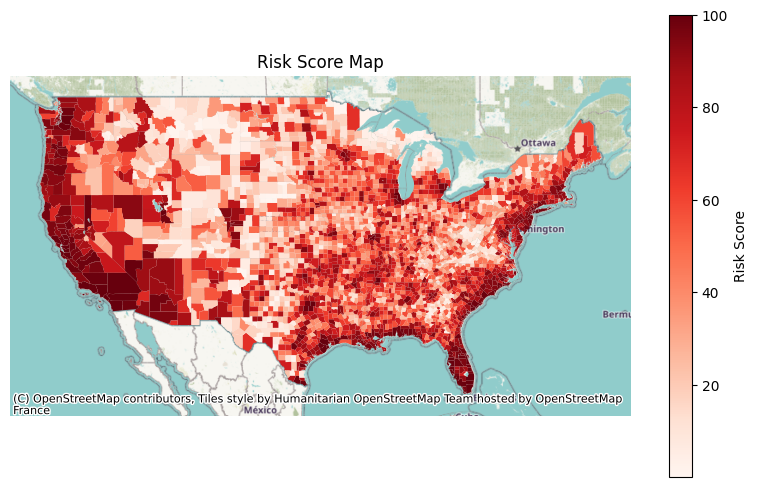

In [296]:
#Is one of these easier to comprehend than the other color-wise?

fig, ax = plt.subplots(figsize=(10,6))

gis_1 = shape_county[~shape_county.STATE.str.contains("Alaska|Hawaii")].plot(column = 'RISK_SCORE',
                                                                    cmap = 'Reds',
                                                                    legend = True, legend_kwds = {'label': "Risk Score"},
                                                                       ax=ax,)

gis_1.set_axis_off()
gis_1.set_title('Risk Score Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

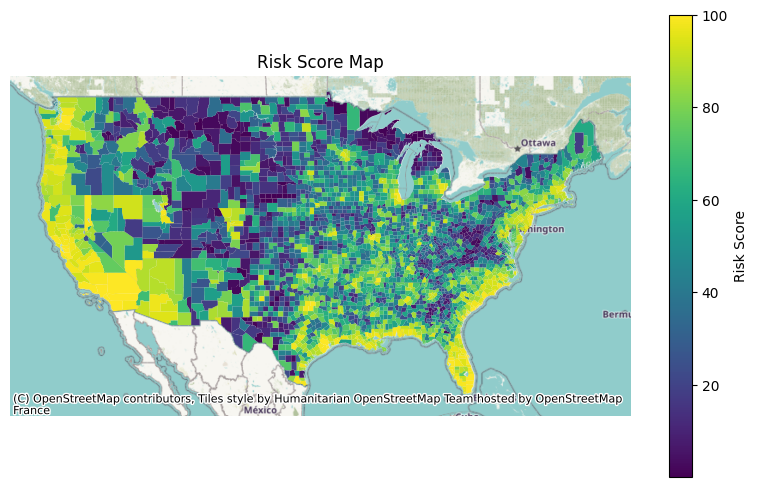

In [294]:
fig, ax = plt.subplots(figsize=(10,6))

gis_2 = shape_county[~shape_county.STATE.str.contains("Alaska|Hawaii")].plot(column = 'RISK_SCORE',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Risk Score"},
                                                                       ax=ax)

gis_2.set_axis_off()
gis_2.set_title('Risk Score Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_default.jpg')

plt.show()

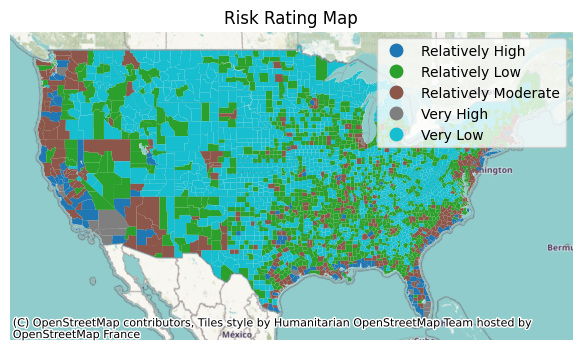

In [295]:
fig, ax = plt.subplots(figsize=(15,4))

gis_3 = shape_county[~shape_county.STATE.str.contains("Alaska|Hawaii")].plot(column = 'RISK_RATNG',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax)

gis_3.set_axis_off()
gis_3.set_title('Risk Rating Map')

contextily.add_basemap(ax)


plt.show()

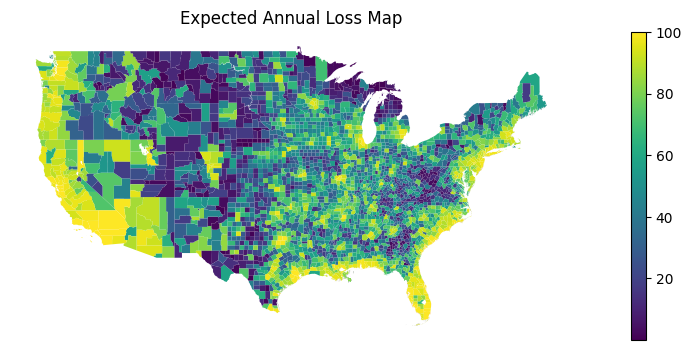

In [184]:
fig, ax = plt.subplots(figsize=(10,6))

gis_3 = shape_county[~shape_county.STATE.str.contains("Alaska|Hawaii")].plot(column = 'EAL_SCORE',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax)

gis_3.set_axis_off()
gis_3.set_title('Expected Annual Loss Map')

contextily.add_basemap(ax)

plt.savefig('gis_expannualloss_national_default.jpg')

plt.show()

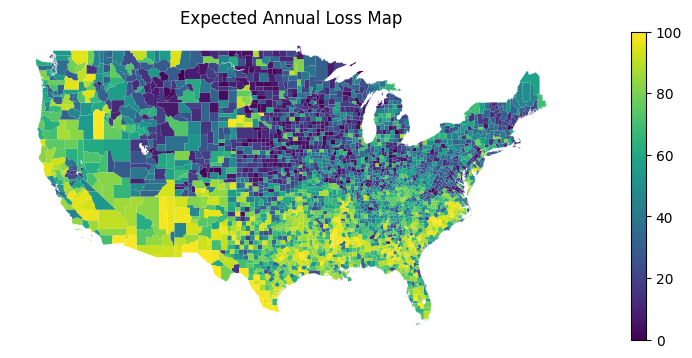

In [183]:
fig, ax = plt.subplots(figsize=(10,6))

gis_3 = shape_county[~shape_county.STATE.str.contains("Alaska|Hawaii")].plot(column = 'SOVI_SCORE',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax)

gis_3.set_axis_off()
gis_3.set_title('Social Vulnerability Map')

contextily.add_basemap(ax)

plt.savefig('gis_sovi_national_default.jpg')

plt.show()

In [454]:
southeast_states = ["Florida", "Georgia", "Tennessee", "North Carolina", "South Carolina", "Alabama", "Mississippi", "Kentucky", "West Virginia", "Virginia"]
southeast_states_filter = '|'.join(southeast_states)

In [455]:
x_coord = [-9653492.196,-9094561.273,-9965769.103,-8822655.680, -9006109.031,-9287062.232,-8741773.766,-9619869.632,-9492176.704,-8985624.622]
y_coord = [3875154.289,3242596.929,3862657.908,4259798.202,4031776.760,3851236.169,4519198.620,4279031.555,4516418.807,4678797.288]
abbrev = ["AL", "FL", "MS", "NC", "SC", "GA", "VA", "TN", "KY", "WV"]

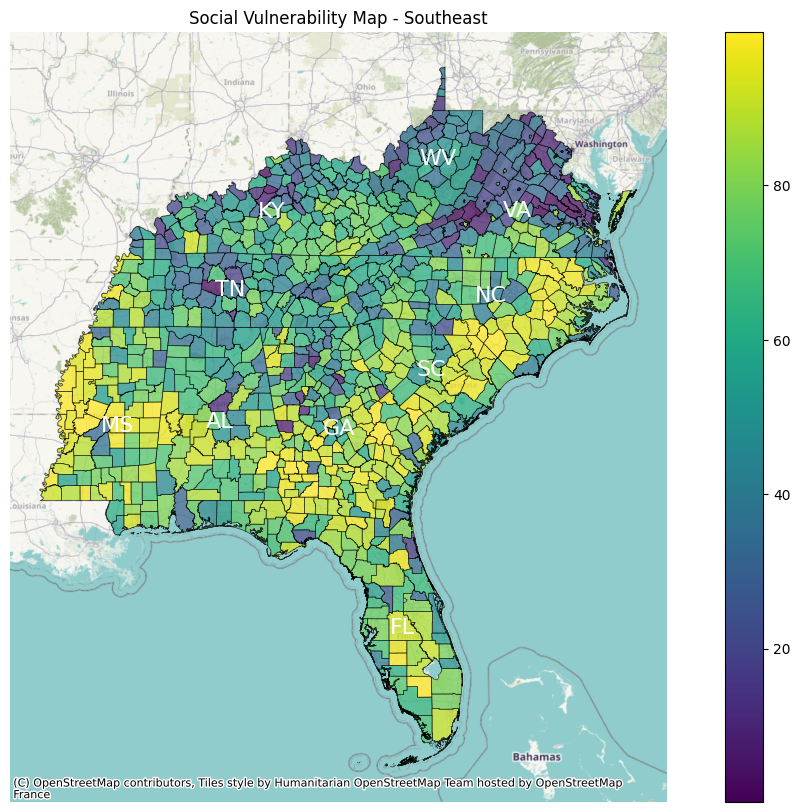

In [252]:
fig, ax = plt.subplots(figsize=(15,10))

gis_4 = shape_county[shape_county.STATE.str.contains(southeast_states_filter)].plot(column = 'SOVI_SCORE',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax, edgecolor = 'k', linewidth = .5, alpha = .75)
for x, y, label in zip(x_coord, y_coord, abbrev):
    gis_4.text(x = x, y= y, s = label, fontsize = 16, ha = 'center', va = 'center', color = 'white')
gis_4.set_axis_off()
gis_4.set_title('Social Vulnerability Map - Southeast')

contextily.add_basemap(ax)

plt.savefig('gis_sovi_southeast_default.jpg')

plt.show()

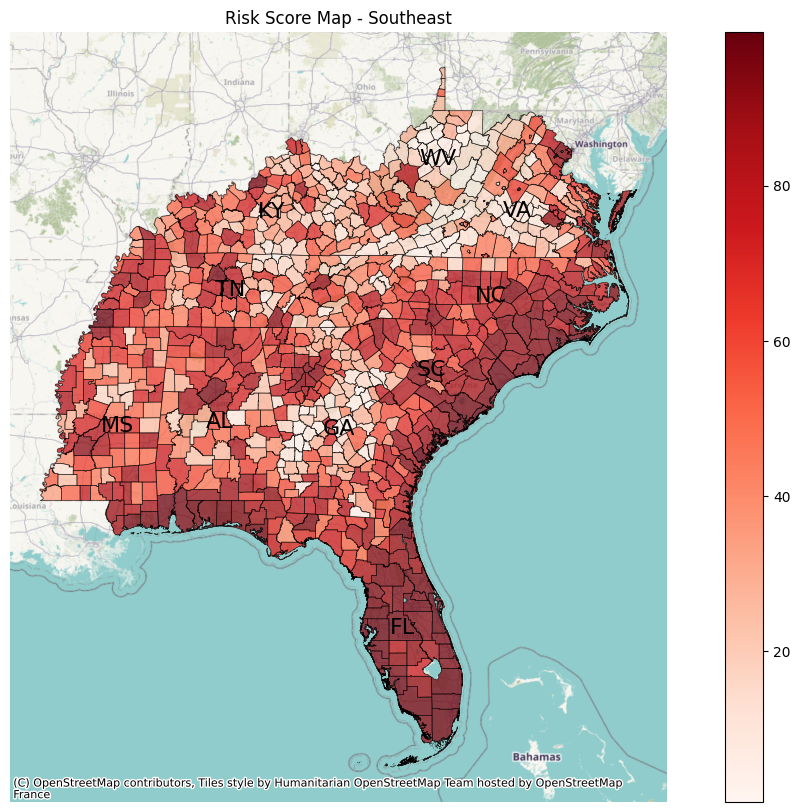

In [493]:
fig, ax = plt.subplots(figsize=(15,10))

gis_5 = shape_county[shape_county.STATE.str.contains(southeast_states_filter)].plot(column = 'RISK_SCORE',
                                                                    cmap = 'Reds',
                                                                    legend = True, 
                                                                       ax=ax, edgecolor = 'k', linewidth = .5, alpha = .75)
for x, y, label in zip(x_coord, y_coord, abbrev):
    gis_5.text(x = x, y= y, s = label, fontsize = 16, ha = 'center', va = 'center', color = 'black')


gis_5.set_axis_off()
gis_5.set_title('Risk Score Map - Southeast')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_southeast_default.jpg')

plt.show()

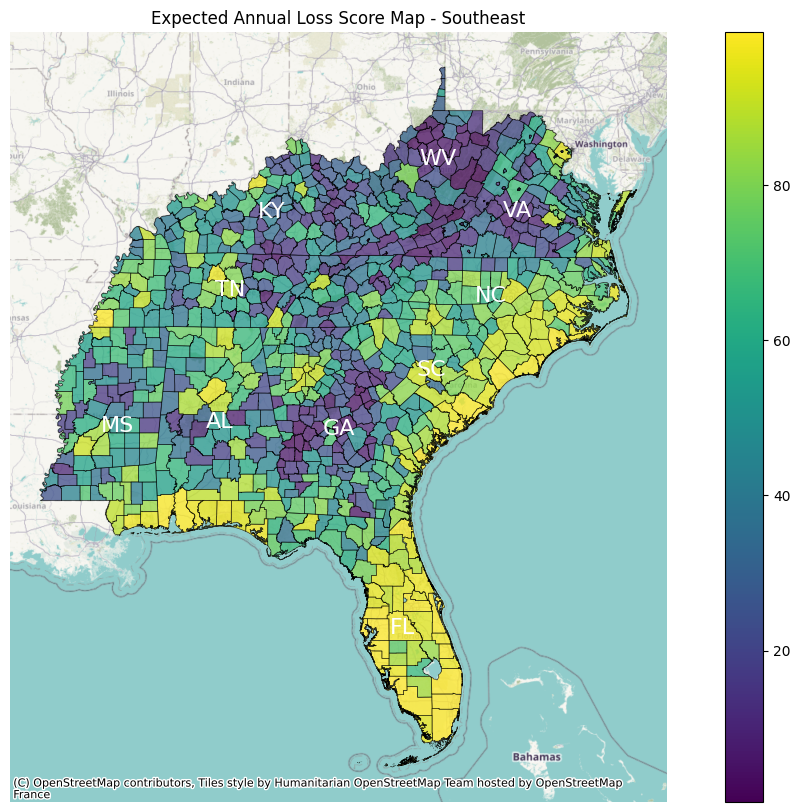

In [253]:
fig, ax = plt.subplots(figsize=(15,10))

gis_5a = shape_county[shape_county.STATE.str.contains(southeast_states_filter)].plot(column = 'EAL_SCORE',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax, edgecolor = 'k', linewidth = .5, alpha = .75)
for x, y, label in zip(x_coord, y_coord, abbrev):
    gis_5a.text(x = x, y= y, s = label, fontsize = 16, ha = 'center', va = 'center', color = 'white')
gis_5a.set_axis_off()
gis_5a.set_title('Expected Annual Loss Score Map - Southeast')

contextily.add_basemap(ax)

#plt.savefig('gis_eal_southeast_default.jpg')

plt.show()

## Import Prediction Data

In [471]:
prediction_data_filtered = prediction_data.filter(["FIPS","Average_Number_of_Physically_Unhealthy_Days" ,
       'Average_Number_of_Mentally_Unhealthy_Days','Life_Expectancy',
       'Age_Adjusted_Death_Rate','Age_Adjusted_Death_Rate_mean_indicator',
       'Life_Expectancy_mean_indicator',
       'Physically_Unhealthy_Days_mean_indicator',
       'Mentally_Unhealthy_Days_mean_indicator',
       'AADR_Predicted', 'Life_Expectancy_Predicted',
       'Physically_Unhealtyh_Predicted', 'Mentally_Unhealthy_Predicted', 'CommunityType'])

In [472]:
prediction_data_filtered_southeast = prediction_data_southeast.filter(["FIPS",
       'SE_AADR_Predicted', 'SE_Life_Expectancy_Predicted',
       'SE_Physically_Unhealthy_Predicted', 'SE_Mentally_Unhealthy_Predicted', 'Community_Type'])

In [473]:
prediction_data_filtered_southeast.head()

,FIPS,SE_AADR_Predicted,SE_Life_Expectancy_Predicted,SE_Physically_Unhealthy_Predicted,SE_Mentally_Unhealthy_Predicted,Community_Type
0,1001.0,1,0,0,1,Small Urban
1,1003.0,1,0,1,1,Small Urban
2,1005.0,1,0,1,1,Rural
3,1007.0,1,0,1,1,Rural
4,1009.0,1,0,1,1,Small Urban


In [474]:
prediction_data_filtered['FIPS'] = prediction_data_filtered['FIPS'].astype(str).apply(lambda x: '0' + x if len(x) == 6 else x)
prediction_data_filtered['FIPS'] = prediction_data_filtered['FIPS'].astype(str).apply(lambda x: x[:5])
prediction_data_filtered['FIPS'] = prediction_data_filtered['FIPS'].astype(object)

In [475]:
prediction_data_filtered_southeast['FIPS'] = prediction_data_filtered_southeast['FIPS'].astype(str).apply(lambda x: '0' + x if len(x) == 6 else x)
prediction_data_filtered_southeast['FIPS'] = prediction_data_filtered_southeast['FIPS'].astype(str).apply(lambda x: x[:5])
prediction_data_filtered_southeast['FIPS'] = prediction_data_filtered_southeast['FIPS'].astype(object)

In [449]:
shape_county = shape_county.rename(columns = {'STCOFIPS': "FIPS"})

In [387]:
shape_county_merged = pd.merge(shape_county, prediction_data_filtered, how = "left", on = "FIPS")

In [477]:
shape_county_merged_southeast = pd.merge(shape_county_merged, prediction_data_filtered_southeast, how = "left", on = "FIPS")

In [478]:
shape_county_merged_southeast.head()

,NRI_ID,STATE,STATEABBRV,STATEFIPS,COUNTY,COUNTYTYPE,COUNTYFIPS,FIPS,POPULATION,BUILDVALUE,...,Mentally_Unhealthy_Predicted,Life_Expectancy_correct_prediction,AADR_correct_prediction,Mentally_Unhealthy_correct_prediction,Physically_Unhealthy_correct_prediction,SE_AADR_Predicted,SE_Life_Expectancy_Predicted,SE_Physically_Unhealthy_Predicted,SE_Mentally_Unhealthy_Predicted,Community_Type
0,C01001,Alabama,AL,01,Autauga,County,001,01001,58764,9.123274e+09,...,Above Average,False,True,False,True,1.0,0.0,0.0,1.0,Small Urban
1,C01003,Alabama,AL,01,Baldwin,County,003,01003,231365,4.596848e+10,...,Above Average,True,True,False,True,1.0,0.0,1.0,1.0,Small Urban
2,C01005,Alabama,AL,01,Barbour,County,005,01005,25160,4.847697e+09,...,Above Average,True,True,True,True,1.0,0.0,1.0,1.0,Rural
3,C01007,Alabama,AL,01,Bibb,County,007,01007,22239,3.146947e+09,...,Above Average,True,True,True,True,1.0,0.0,1.0,1.0,Rural
4,C01009,Alabama,AL,01,Blount,County,009,01009,58992,7.815620e+09,...,Above Average,False,False,True,False,1.0,0.0,1.0,1.0,Small Urban


In [479]:
shape_county_merged['Life_Expectancy_correct_prediction'] = (shape_county_merged['Life_Expectancy_mean_indicator'] == shape_county_merged['Life_Expectancy_Predicted']) 
shape_county_merged['AADR_correct_prediction'] = (shape_county_merged['Age_Adjusted_Death_Rate_mean_indicator'] == shape_county_merged['AADR_Predicted']) 
shape_county_merged['Mentally_Unhealthy_correct_prediction'] = (shape_county_merged['Mentally_Unhealthy_Days_mean_indicator'] == shape_county_merged['Mentally_Unhealthy_Predicted']) 
shape_county_merged['Physically_Unhealthy_correct_prediction'] = (shape_county_merged['Physically_Unhealthy_Days_mean_indicator'] == shape_county_merged['Physically_Unhealtyh_Predicted'])

In [480]:
shape_county_merged_southeast['SE_Life_Expectancy_correct_prediction'] = (shape_county_merged_southeast['Life_Expectancy_mean_indicator'] == shape_county_merged_southeast['SE_Life_Expectancy_Predicted']) 
shape_county_merged_southeast['SE_AADR_correct_prediction'] = (shape_county_merged_southeast['Age_Adjusted_Death_Rate_mean_indicator'] == shape_county_merged_southeast['SE_AADR_Predicted']) 
shape_county_merged_southeast['SE_Mentally_Unhealthy_correct_prediction'] = (shape_county_merged_southeast['Mentally_Unhealthy_Days_mean_indicator'] == shape_county_merged_southeast['SE_Mentally_Unhealthy_Predicted']) 
shape_county_merged_southeast['SE_Physically_Unhealthy_correct_prediction'] = (shape_county_merged_southeast['Physically_Unhealthy_Days_mean_indicator'] == shape_county_merged_southeast['SE_Physically_Unhealthy_Predicted'])

In [485]:
shape_county_merged_southeast['SE_Physically_Unhealthy_correct_prediction'].describe() 

count          3143
unique            2
top       Incorrect
freq           2443
Name: SE_Physically_Unhealthy_correct_prediction, dtype: object

In [482]:
shape_county_merged_southeast['Mentally_Unhealthy_Days_mean_indicator']

0       Below Average
1       Below Average
2       Above Average
3       Above Average
4       Above Average
            ...      
3138    Below Average
3139    Below Average
3140    Below Average
3141    Below Average
3142    Below Average
Name: Mentally_Unhealthy_Days_mean_indicator, Length: 3143, dtype: object

In [392]:
shape_county_merged['Mentally_Unhealthy_Days_mean_indicator'] = shape_county_merged['Mentally_Unhealthy_Days_mean_indicator'].replace({1.0: "Above Average", 0.0: "Below Average"})
shape_county_merged['Physically_Unhealthy_Days_mean_indicator'] = shape_county_merged['Physically_Unhealthy_Days_mean_indicator'].replace({1.0: "Above Average", 0.0: "Below Average"})
shape_county_merged['Age_Adjusted_Death_Rate_mean_indicator'] = shape_county_merged['Age_Adjusted_Death_Rate_mean_indicator'].replace({1.0: "Above Average", 0.0: "Below Average"})
shape_county_merged['Life_Expectancy_mean_indicator'] = shape_county_merged['Life_Expectancy_mean_indicator'].replace({1.0: "Above Average", 0.0: "Below Average"})

shape_county_merged['Mentally_Unhealthy_Predicted'] = shape_county_merged['Mentally_Unhealthy_Predicted'].replace({1.0: "Above Average", 0.0: "Below Average"})
shape_county_merged['Physically_Unhealtyh_Predicted'] = shape_county_merged['Physically_Unhealtyh_Predicted'].replace({1.0: "Above Average", 0.0: "Below Average"})
shape_county_merged['AADR_Predicted'] = shape_county_merged['AADR_Predicted'].replace({1.0: "Above Average", 0.0: "Below Average"})
shape_county_merged['Life_Expectancy_Predicted'] = shape_county_merged['Life_Expectancy_Predicted'].replace({1.0: "Above Average", 0.0: "Below Average"})

In [483]:
shape_county_merged_southeast['Mentally_Unhealthy_Days_mean_indicator'] = shape_county_merged_southeast['Mentally_Unhealthy_Days_mean_indicator'].replace({1.0: "Above Average", 0.0: "Below Average"})
shape_county_merged_southeast['Physically_Unhealthy_Days_mean_indicator'] = shape_county_merged_southeast['Physically_Unhealthy_Days_mean_indicator'].replace({1.0: "Above Average", 0.0: "Below Average"})
shape_county_merged_southeast['Age_Adjusted_Death_Rate_mean_indicator'] = shape_county_merged_southeast['Age_Adjusted_Death_Rate_mean_indicator'].replace({1.0: "Above Average", 0.0: "Below Average"})
shape_county_merged_southeast['Life_Expectancy_mean_indicator'] = shape_county_merged_southeast['Life_Expectancy_mean_indicator'].replace({1.0: "Above Average", 0.0: "Below Average"})

shape_county_merged_southeast['SE_Mentally_Unhealthy_Predicted'] = shape_county_merged_southeast['SE_Mentally_Unhealthy_Predicted'].replace({1.0: "Above Average", 0.0: "Below Average"})
shape_county_merged_southeast['SE_Physically_Unhealthy_Predicted'] = shape_county_merged_southeast['SE_Physically_Unhealthy_Predicted'].replace({1.0: "Above Average", 0.0: "Below Average"})
shape_county_merged_southeast['SE_AADR_Predicted'] = shape_county_merged_southeast['SE_AADR_Predicted'].replace({1.0: "Above Average", 0.0: "Below Average"})
shape_county_merged_southeast['SE_Life_Expectancy_Predicted'] = shape_county_merged_southeast['SE_Life_Expectancy_Predicted'].replace({1.0: "Above Average", 0.0: "Below Average"})

In [484]:
shape_county_merged_southeast['SE_Life_Expectancy_correct_prediction'] = (shape_county_merged_southeast['Life_Expectancy_mean_indicator'] == shape_county_merged_southeast['SE_Life_Expectancy_Predicted']) 
shape_county_merged_southeast['SE_AADR_correct_prediction'] = (shape_county_merged_southeast['Age_Adjusted_Death_Rate_mean_indicator'] == shape_county_merged_southeast['SE_AADR_Predicted']) 
shape_county_merged_southeast['SE_Mentally_Unhealthy_correct_prediction'] = (shape_county_merged_southeast['Mentally_Unhealthy_Days_mean_indicator'] == shape_county_merged_southeast['SE_Mentally_Unhealthy_Predicted']) 
shape_county_merged_southeast['SE_Physically_Unhealthy_correct_prediction'] = (shape_county_merged_southeast['Physically_Unhealthy_Days_mean_indicator'] == shape_county_merged_southeast['SE_Physically_Unhealthy_Predicted'])

shape_county_merged_southeast['SE_Mentally_Unhealthy_correct_prediction'] = shape_county_merged_southeast['SE_Mentally_Unhealthy_correct_prediction'].replace({True: "Correct", False: "Incorrect"})
shape_county_merged_southeast['SE_Physically_Unhealthy_correct_prediction'] = shape_county_merged_southeast['SE_Physically_Unhealthy_correct_prediction'].replace({True: "Correct", False: "Incorrect"})
shape_county_merged_southeast['SE_AADR_correct_prediction'] = shape_county_merged_southeast['SE_AADR_correct_prediction'].replace({True: "Correct", False: "Incorrect"})
shape_county_merged_southeast['SE_Life_Expectancy_correct_prediction'] = shape_county_merged_southeast['SE_Life_Expectancy_correct_prediction'].replace({True: "Correct", False: "Incorrect"})

### Life Expectancy Prediction Maps

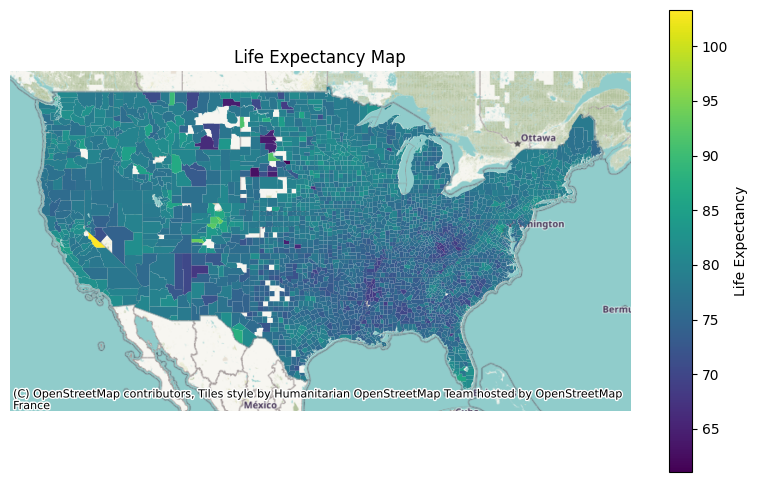

In [117]:
fig, ax = plt.subplots(figsize=(10,6))

gis_6 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Life_Expectancy',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Life Expectancy"},
                                                                       ax=ax)

gis_6.set_axis_off()
gis_6.set_title('Life Expectancy Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

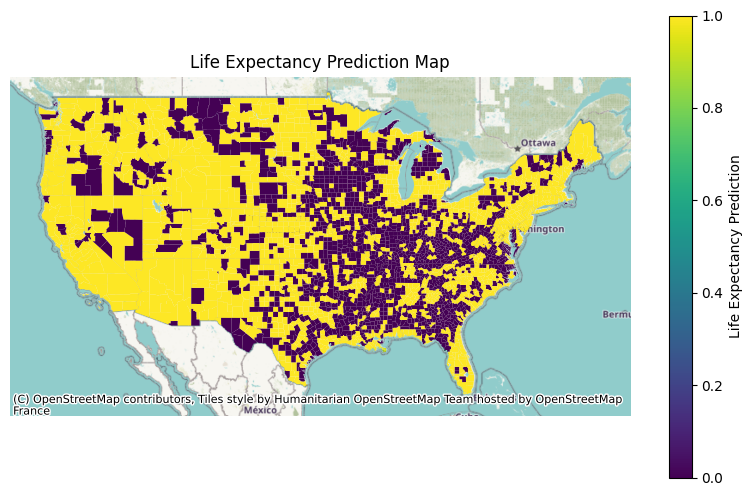

In [118]:
fig, ax = plt.subplots(figsize=(10,6))

gis_7 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Life_Expectancy_Predicted',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Life Expectancy Prediction"},
                                                                       ax=ax)

gis_7.set_axis_off()
gis_7.set_title('Life Expectancy Prediction Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

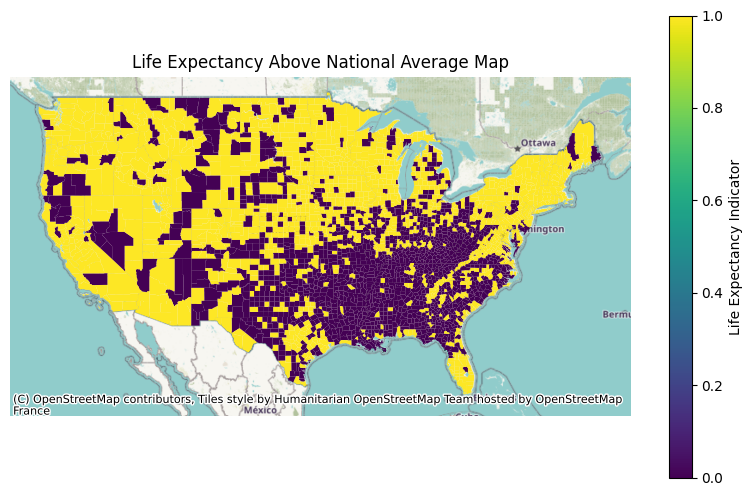

In [119]:
fig, ax = plt.subplots(figsize=(10,6))

gis_8 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Life_Expectancy_mean_indicator',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Life Expectancy Indicator"},
                                                                       ax=ax)

gis_8.set_axis_off()
gis_8.set_title('Life Expectancy Above National Average Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

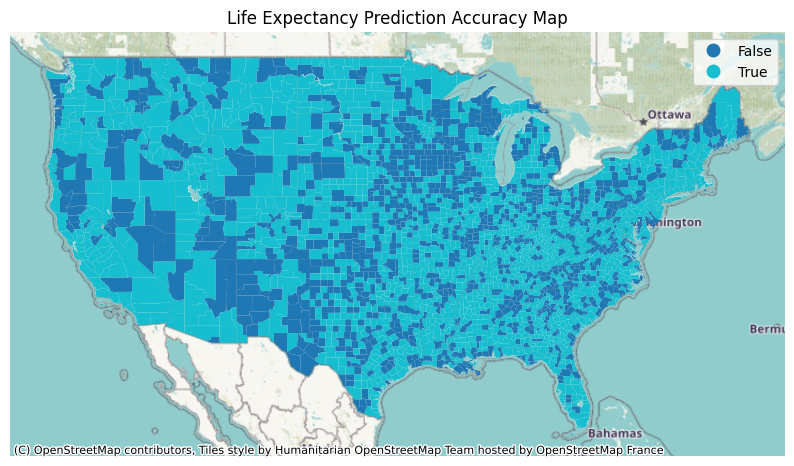

In [124]:
fig, ax = plt.subplots(figsize=(10,6))

gis_9 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Life_Expectancy_correct_prediction',
                                                                    
                                                                    legend = True,
                                                                       ax=ax)

gis_9.set_axis_off()
gis_9.set_title('Life Expectancy Prediction Accuracy Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

### Age-Adjusted Death Rate Prediction

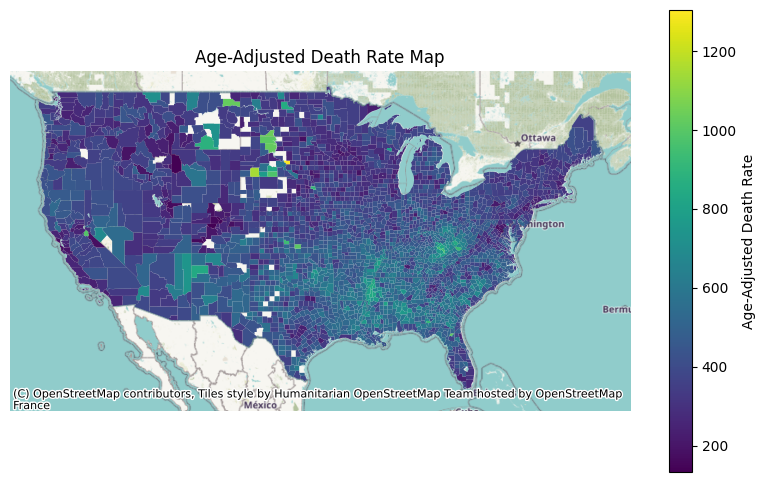

In [125]:
fig, ax = plt.subplots(figsize=(10,6))

gis_10 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Age_Adjusted_Death_Rate',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Age-Adjusted Death Rate"},
                                                                       ax=ax)

gis_10.set_axis_off()
gis_10.set_title('Age-Adjusted Death Rate Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

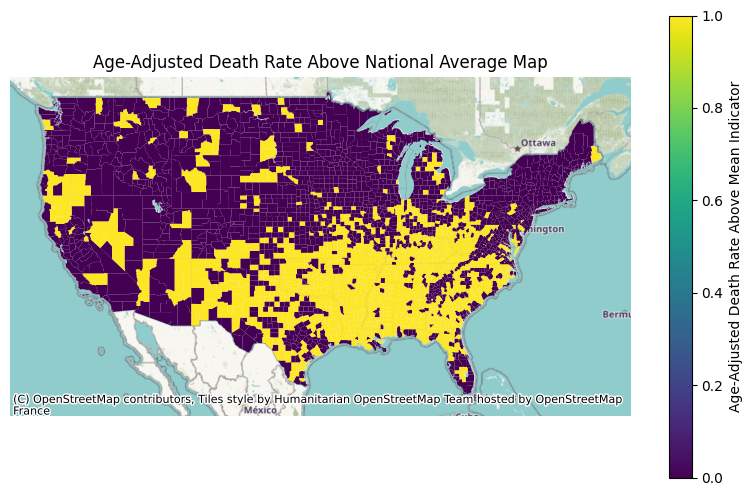

In [126]:
fig, ax = plt.subplots(figsize=(10,6))

gis_11 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Age_Adjusted_Death_Rate_mean_indicator',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Age-Adjusted Death Rate Above Mean Indicator"},
                                                                       ax=ax)

gis_11.set_axis_off()
gis_11.set_title('Age-Adjusted Death Rate Above National Average Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

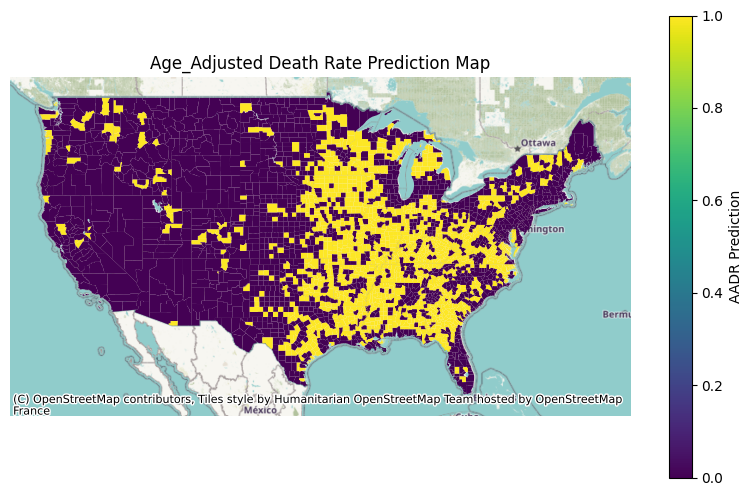

In [127]:
fig, ax = plt.subplots(figsize=(10,6))

gis_12 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'AADR_Predicted',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "AADR Prediction"},
                                                                       ax=ax)

gis_12.set_axis_off()
gis_12.set_title('Age_Adjusted Death Rate Prediction Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

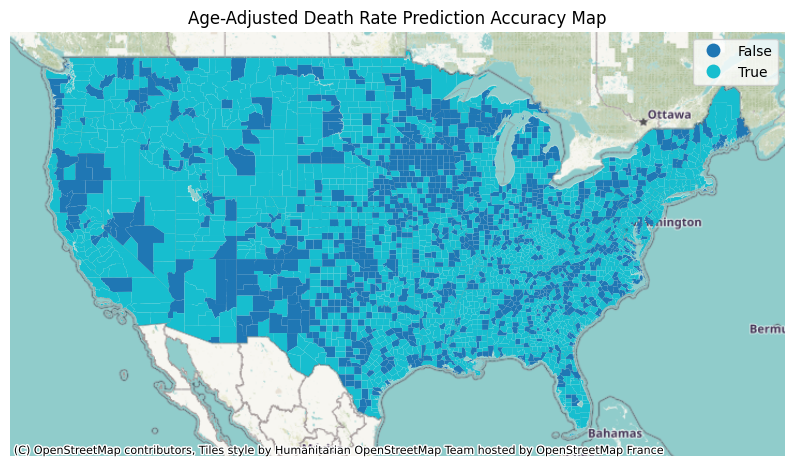

In [129]:
fig, ax = plt.subplots(figsize=(10,6))

gis_13 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'AADR_correct_prediction',
                                                                    
                                                                    legend = True,
                                                                       ax=ax)

gis_13.set_axis_off()
gis_13.set_title('Age-Adjusted Death Rate Prediction Accuracy Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

### Number Physically Unhealthy Days

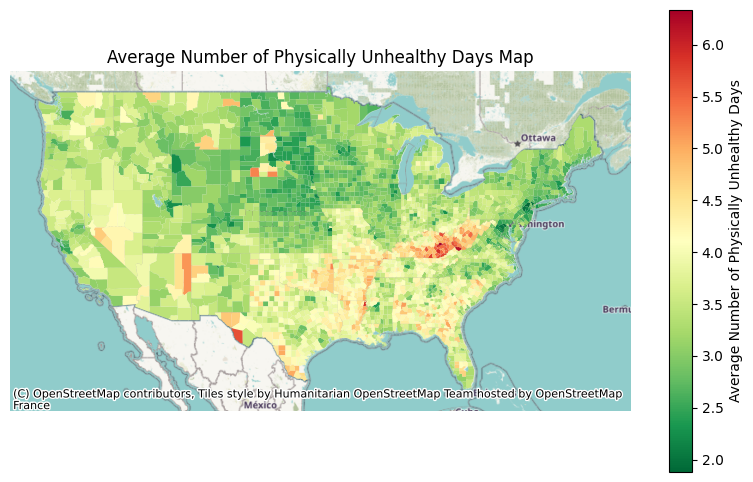

In [489]:
fig, ax = plt.subplots(figsize=(10,6))

gis_14 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Average_Number_of_Physically_Unhealthy_Days',
                                                                    cmap = 'RdYlGn_r',
                                                                    legend = True, legend_kwds = {'label': "Average Number of Physically Unhealthy Days"},
                                                                       ax=ax)

gis_14.set_axis_off()
gis_14.set_title('Average Number of Physically Unhealthy Days Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

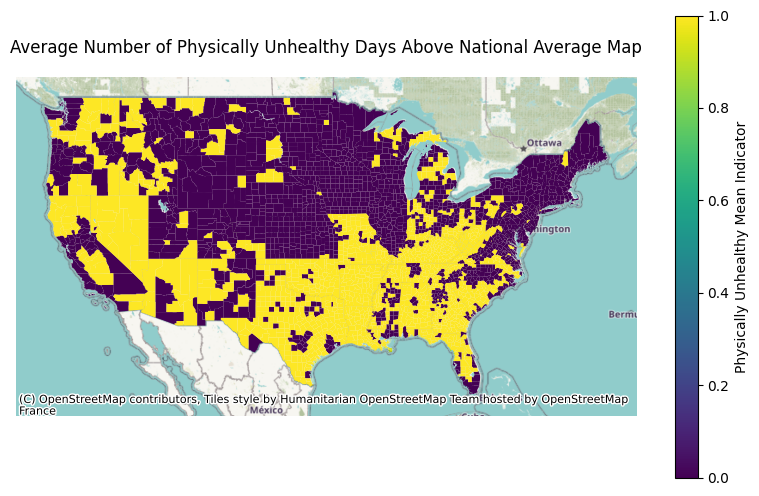

In [133]:
fig, ax = plt.subplots(figsize=(10,6))

gis_15 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Physically_Unhealthy_Days_mean_indicator',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Physically Unhealthy Mean Indicator"},
                                                                       ax=ax)

gis_15.set_axis_off()
gis_15.set_title('Average Number of Physically Unhealthy Days Above National Average Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

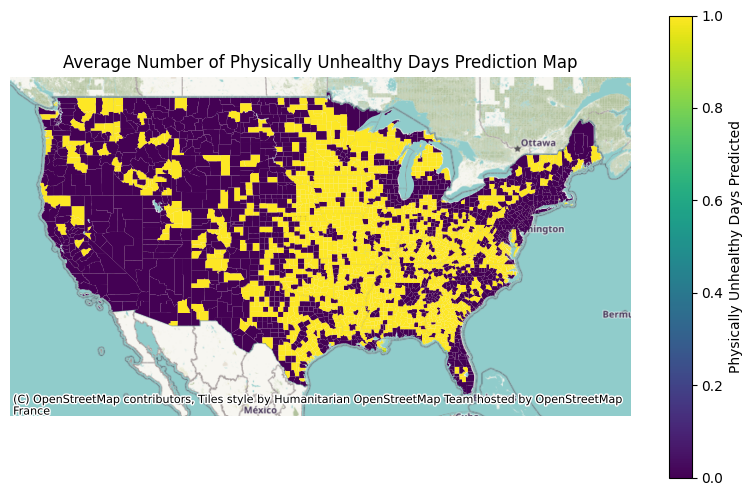

In [134]:
fig, ax = plt.subplots(figsize=(10,6))

gis_16 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Physically_Unhealtyh_Predicted',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Physically Unhealthy Days Predicted"},
                                                                       ax=ax)

gis_16.set_axis_off()
gis_16.set_title('Average Number of Physically Unhealthy Days Prediction Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

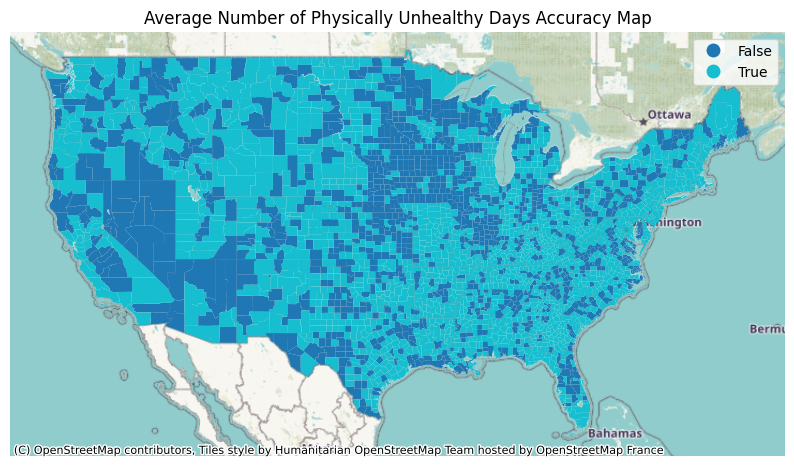

In [135]:
fig, ax = plt.subplots(figsize=(10,6))

gis_17 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Physically_Unhealthy_correct_prediction',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax)

gis_17.set_axis_off()
gis_17.set_title('Average Number of Physically Unhealthy Days Accuracy Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

#### Southeast Physical Health

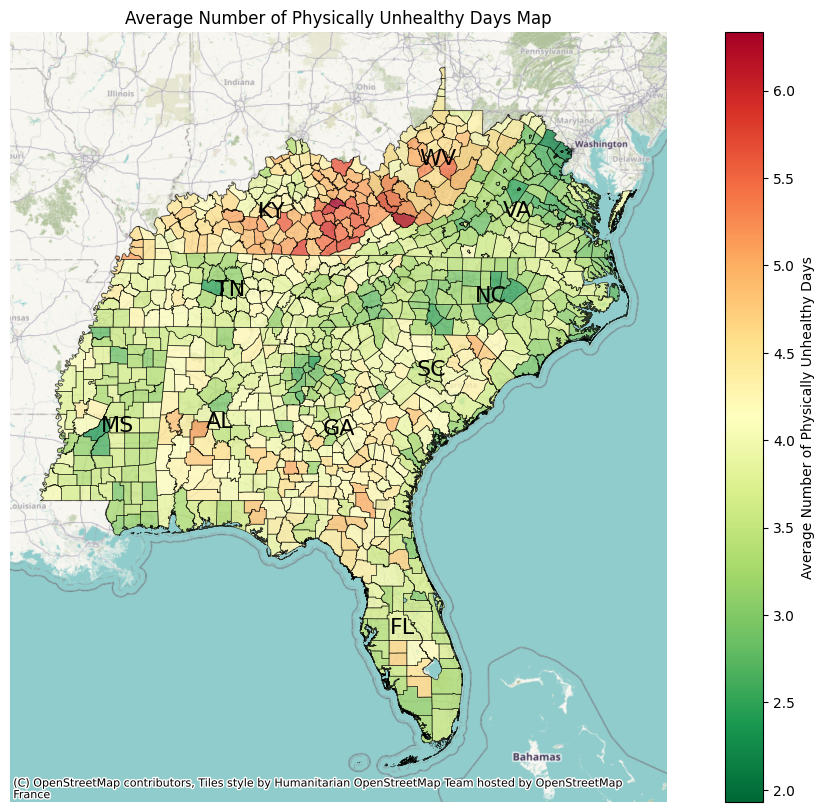

In [430]:
fig, ax = plt.subplots(figsize=(15,10))

gis_22 = shape_county_merged[shape_county_merged.STATE.str.contains(southeast_states_filter)].plot(column = 'Average_Number_of_Physically_Unhealthy_Days',
                                                                    cmap = 'RdYlGn_r',
                                                                    legend = True, legend_kwds = {'label': "Average Number of Physically Unhealthy Days"},
                                                                       ax=ax, edgecolor = 'k', linewidth = .5, alpha = .75)
for x, y, label in zip(x_coord, y_coord, abbrev):
    gis_22.text(x = x, y= y, s = label, fontsize = 16, ha = 'center', va = 'center', color = 'black')
gis_22.set_axis_off()
gis_22.set_title('Average Number of Physically Unhealthy Days Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

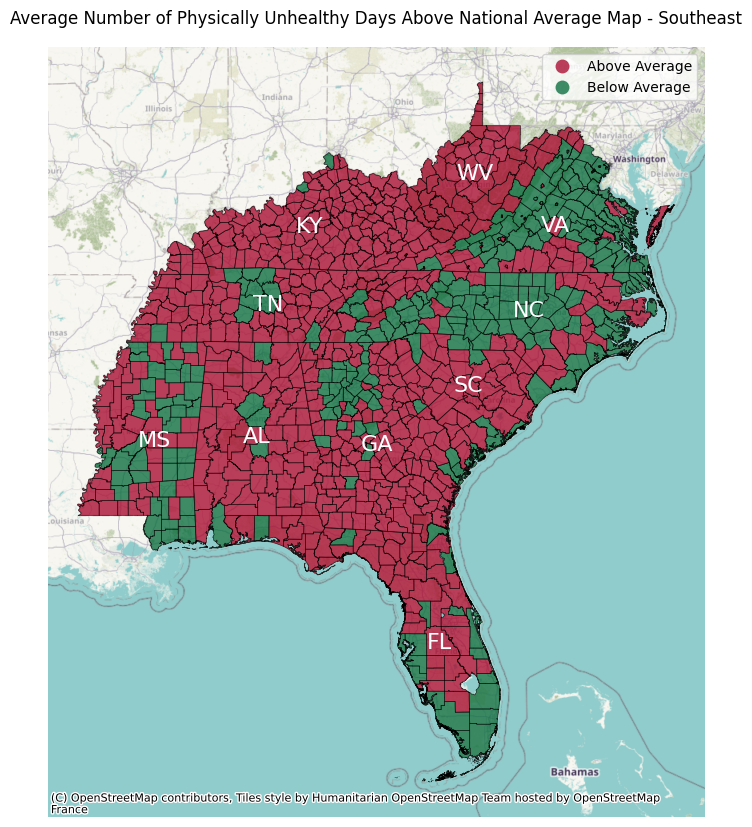

In [348]:
fig, ax = plt.subplots(figsize=(15,10))

gis_23 = shape_county_merged_southeast[shape_county_merged_southeast.STATE.str.contains(southeast_states_filter)].plot(column = 'Physically_Unhealthy_Days_mean_indicator',
                                                                    
                                                                    legend = True, cmap = 'RdYlGn',
                                                                       ax=ax, edgecolor = 'k', linewidth = .5, alpha = .75)
for x, y, label in zip(x_coord, y_coord, abbrev):
    gis_23.text(x = x, y= y, s = label, fontsize = 16, ha = 'center', va = 'center', color = 'white')
gis_23.set_axis_off()
gis_23.set_title('Average Number of Physically Unhealthy Days Above National Average Map - Southeast')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

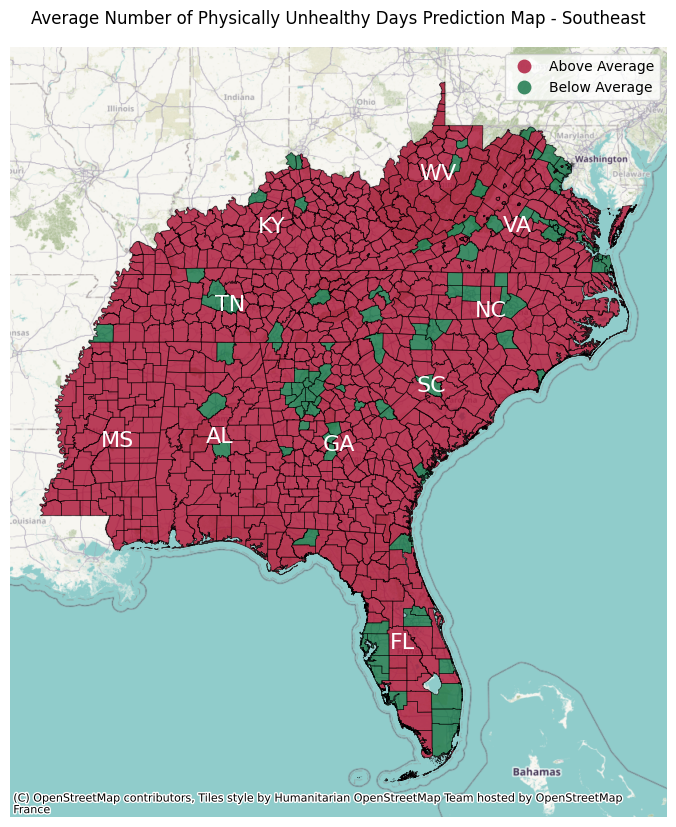

In [443]:
fig, ax = plt.subplots(figsize=(15,10))

gis_24 = shape_county_merged_southeast[shape_county_merged_southeast.STATE.str.contains(southeast_states_filter)].plot(column = 'SE_Physically_Unhealthy_Predicted',
                                                                    
                                                                    legend = True, cmap= "RdYlGn",
                                                                       ax=ax, edgecolor = 'k', linewidth = .5, alpha = .75)
for x, y, label in zip(x_coord, y_coord, abbrev):
    gis_24.text(x = x, y= y, s = label, fontsize = 16, ha = 'center', va = 'center', color = 'white')
gis_24.set_axis_off()
gis_24.set_title('Average Number of Physically Unhealthy Days Prediction Map - Southeast')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

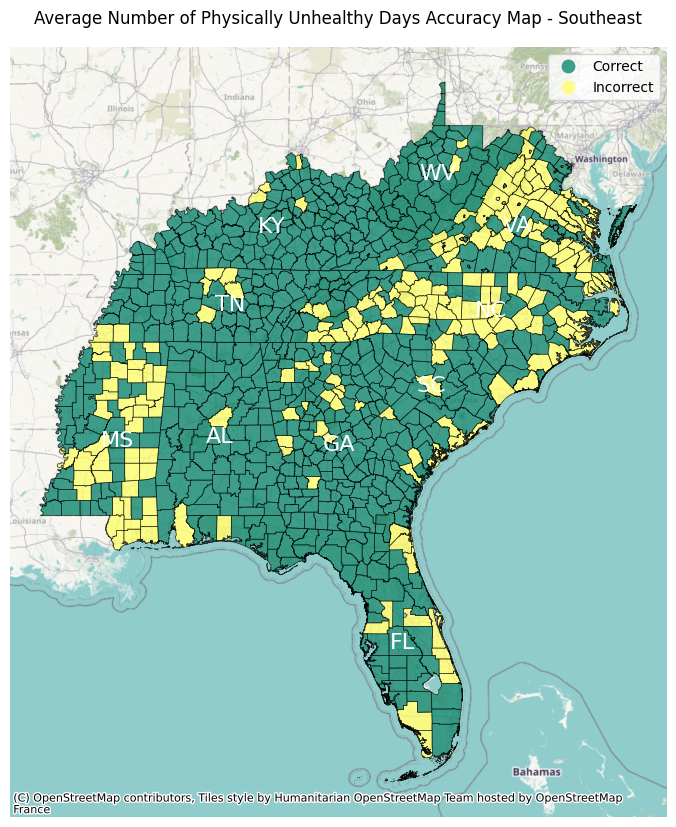

In [486]:
fig, ax = plt.subplots(figsize=(15,10))

gis_25 = shape_county_merged_southeast[shape_county_merged_southeast.STATE.str.contains(southeast_states_filter)].plot(column = 'SE_Physically_Unhealthy_correct_prediction',
                                                                    
                                                                    legend = True, cmap = 'summer',
                                                                       ax=ax, edgecolor = 'k', linewidth = .5, alpha = .75)
for x, y, label in zip(x_coord, y_coord, abbrev):
    gis_25.text(x = x, y= y, s = label, fontsize = 16, ha = 'center', va = 'center', color = 'white')
gis_25.set_axis_off()
gis_25.set_title('Average Number of Physically Unhealthy Days Accuracy Map - Southeast')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

In [396]:
shape_county_merged_southeast_filtered = shape_county_merged_southeast[shape_county_merged_southeast.STATE.str.contains(southeast_states_filter)]

In [397]:
shape_county_merged_southeast.SE_Physically_Unhealthy_correct_prediction.describe()

count          3143
unique            2
top       Incorrect
freq           2443
Name: SE_Physically_Unhealthy_correct_prediction, dtype: object

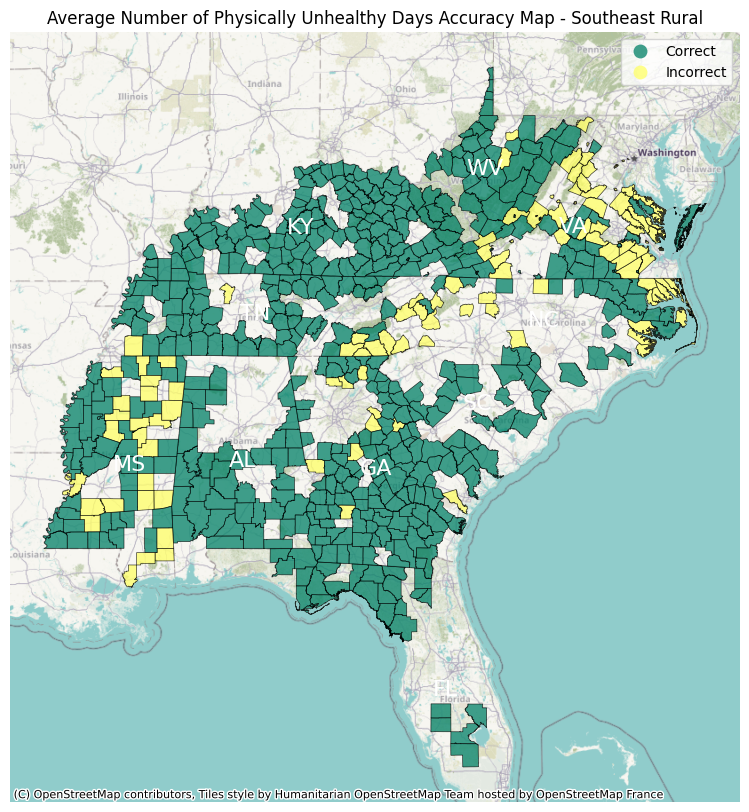

In [398]:
fig, ax = plt.subplots(figsize=(15,10))

gis_25 = shape_county_merged_southeast_filtered[shape_county_merged_southeast_filtered.Community_Type =="Rural"].plot(column = 'SE_Physically_Unhealthy_correct_prediction',
                                                                    
                                                                    legend = True, cmap = 'summer',
                                                                       ax=ax, edgecolor = 'k', linewidth = .5, alpha = .75)
for x, y, label in zip(x_coord, y_coord, abbrev):
    gis_25.text(x = x, y= y, s = label, fontsize = 16, ha = 'center', va = 'center', color = 'white')
gis_25.set_axis_off()
gis_25.set_title('Average Number of Physically Unhealthy Days Accuracy Map - Southeast Rural')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

In [ ]:
fig, ax = plt.subplots(figsize=(15,10))

gis_25 = shape_county_merged_southeast_filtered[shape_county_merged_southeast_filtered.Community_Type =="Small Urban"].plot(column = 'SE_Physically_Unhealthy_correct_prediction',
                                                                    
                                                                    legend = True, cmap = 'summer',
                                                                       ax=ax, edgecolor = 'k', linewidth = .5, alpha = .75)
for x, y, label in zip(x_coord, y_coord, abbrev):
    gis_25.text(x = x, y= y, s = label, fontsize = 16, ha = 'center', va = 'center', color = 'white')
gis_25.set_axis_off()
gis_25.set_title('Average Number of Physically Unhealthy Days Accuracy Map - Southeast Small Urban')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

In [487]:
#get percent correct for physical health by community type
small_urban_phy_perc_correct = shape_county_merged_southeast_filtered[(shape_county_merged_southeast_filtered.Community_Type =="Small Urban") & (shape_county_merged_southeast_filtered.SE_Physically_Unhealthy_correct_prediction == "Correct")].shape[0]/shape_county_merged_southeast_filtered[(shape_county_merged_southeast_filtered.Community_Type =="Small Urban")].shape[0]
rural_phy_perc_correct = shape_county_merged_southeast_filtered[(shape_county_merged_southeast_filtered.Community_Type =="Rural") & (shape_county_merged_southeast_filtered.SE_Physically_Unhealthy_correct_prediction == "Correct")].shape[0]/shape_county_merged_southeast_filtered[(shape_county_merged_southeast_filtered.Community_Type =="Rural")].shape[0]
urban_phy_perc_correct = shape_county_merged_southeast_filtered[(shape_county_merged_southeast_filtered.Community_Type =="Urban") & (shape_county_merged_southeast_filtered.SE_Physically_Unhealthy_correct_prediction == "Correct")].shape[0]/shape_county_merged_southeast_filtered[(shape_county_merged_southeast_filtered.Community_Type =="Urban")].shape[0]

print("Rural Physical Health % Correct Predicted: " + str(rural_phy_perc_correct))
print("Small Urban Physical Health % Correct Predicted: " + str(small_urban_phy_perc_correct))
print("Urban Physical Health % Correct Predicted: " + str(urban_phy_perc_correct))

Rural Physical Health % Correct Predicted: 0.8128
Small Urban Physical Health % Correct Predicted: 0.6075949367088608
Urban Physical Health % Correct Predicted: 0.7741935483870968


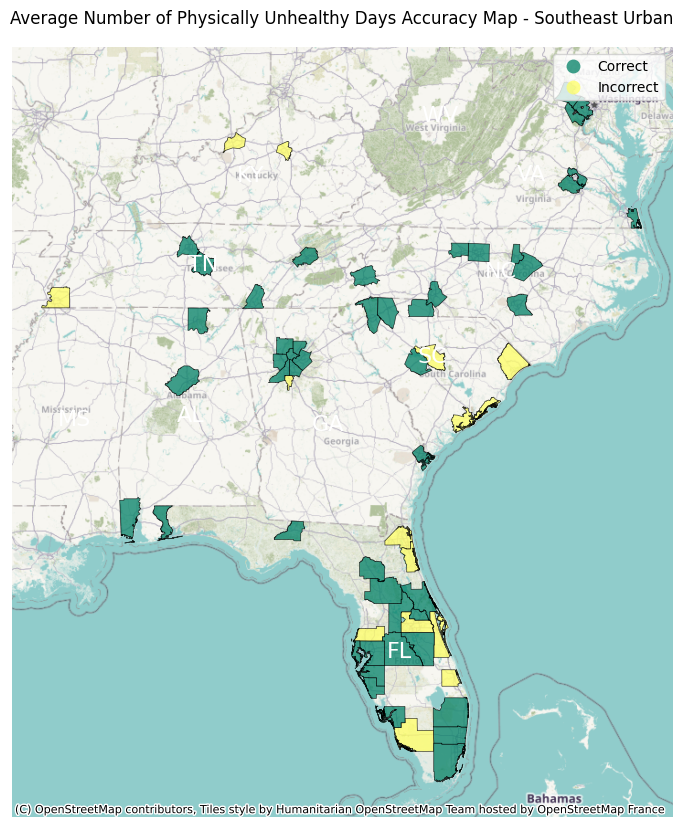

In [400]:
fig, ax = plt.subplots(figsize=(15,10))

gis_25 = shape_county_merged_southeast_filtered[shape_county_merged_southeast_filtered.Community_Type =="Urban"].plot(column = 'SE_Physically_Unhealthy_correct_prediction',
                                                                    
                                                                    legend = True, cmap = 'summer',
                                                                       ax=ax, edgecolor = 'k', linewidth = .5, alpha = .75)
for x, y, label in zip(x_coord, y_coord, abbrev):
    gis_25.text(x = x, y= y, s = label, fontsize = 16, ha = 'center', va = 'center', color = 'white')
gis_25.set_axis_off()
gis_25.set_title('Average Number of Physically Unhealthy Days Accuracy Map - Southeast Urban')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

### Mentally Unhealthy Days

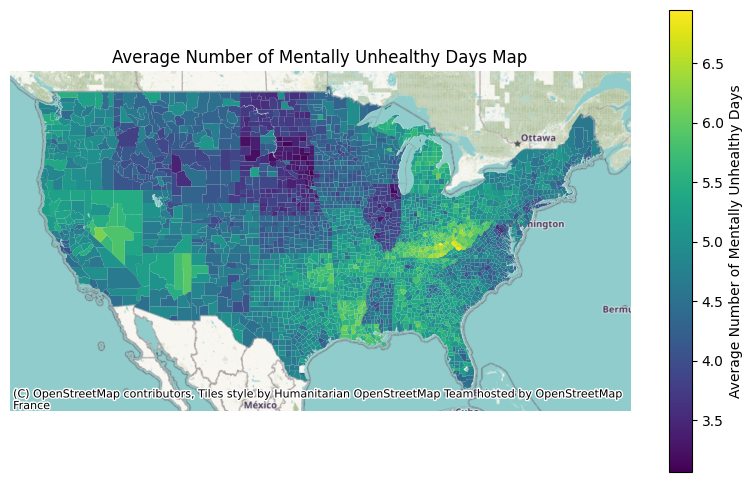

In [136]:
fig, ax = plt.subplots(figsize=(10,6))

gis_18 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Average_Number_of_Mentally_Unhealthy_Days',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Average Number of Mentally Unhealthy Days"},
                                                                       ax=ax)

gis_18.set_axis_off()
gis_18.set_title('Average Number of Mentally Unhealthy Days Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

# This graph is the most interesting so far to me, you can see how distinct the state lines are in colors, could be because of statewide policies surrounding mental health

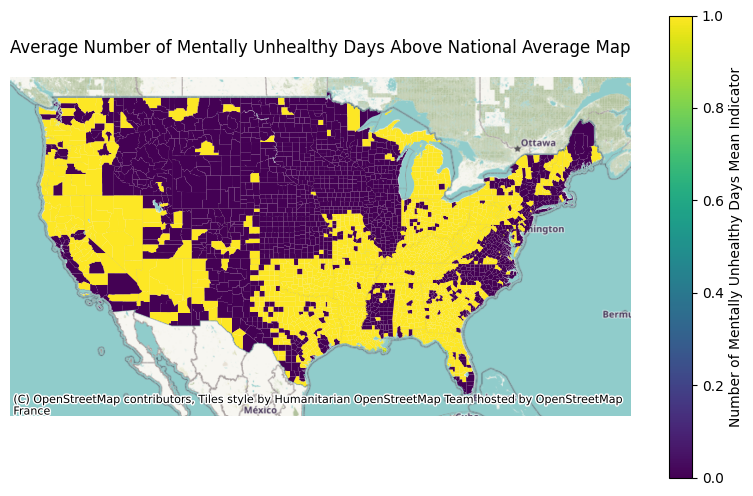

In [137]:
fig, ax = plt.subplots(figsize=(10,6))

gis_19 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Mentally_Unhealthy_Days_mean_indicator',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Number of Mentally Unhealthy Days Mean Indicator"},
                                                                       ax=ax)

gis_19.set_axis_off()
gis_19.set_title('Average Number of Mentally Unhealthy Days Above National Average Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

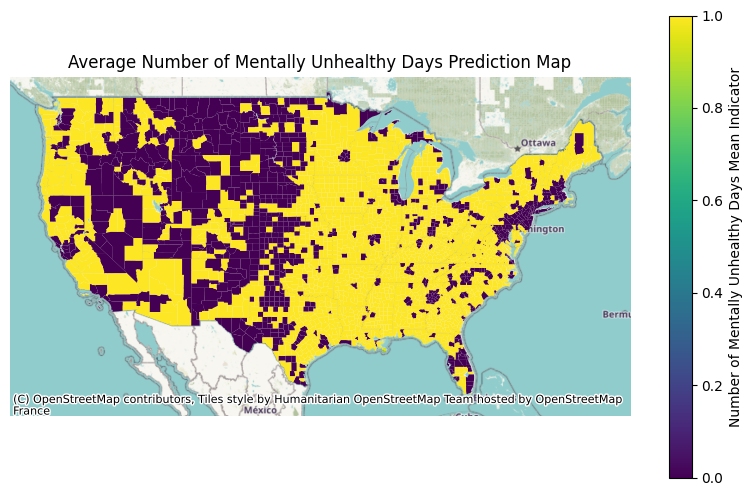

In [139]:
fig, ax = plt.subplots(figsize=(10,6))

gis_20 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Mentally_Unhealthy_Predicted',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Number of Mentally Unhealthy Days Mean Indicator"},
                                                                       ax=ax)

gis_20.set_axis_off()
gis_20.set_title('Average Number of Mentally Unhealthy Days Prediction Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

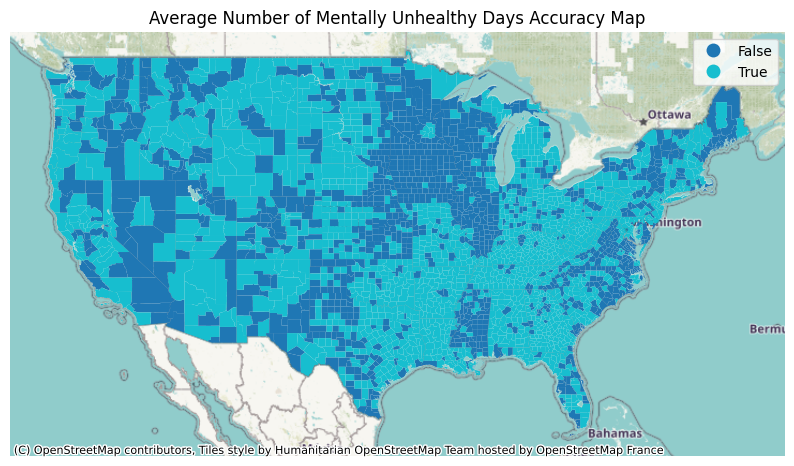

In [140]:
fig, ax = plt.subplots(figsize=(10,6))

gis_21 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Mentally_Unhealthy_correct_prediction',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax)

gis_21.set_axis_off()
gis_21.set_title('Average Number of Mentally Unhealthy Days Accuracy Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

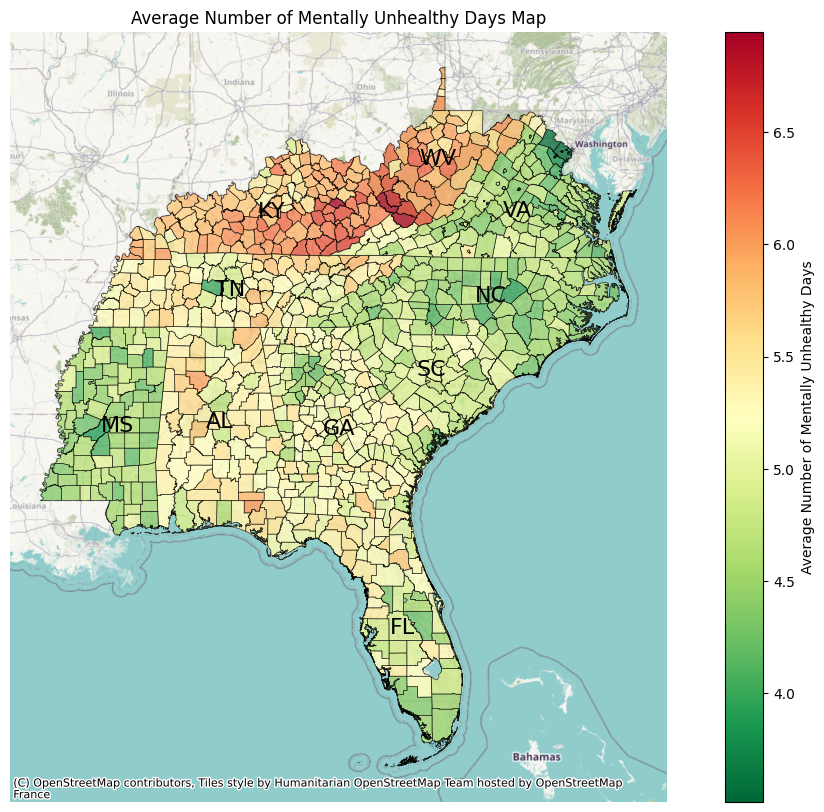

In [432]:
fig, ax = plt.subplots(figsize=(15,10))

gis_22 = shape_county_merged[shape_county_merged.STATE.str.contains(southeast_states_filter)].plot(column = 'Average_Number_of_Mentally_Unhealthy_Days',
                                                                    cmap = 'RdYlGn_r',
                                                                    legend = True, legend_kwds = {'label': "Average Number of Mentally Unhealthy Days"},
                                                                       ax=ax, edgecolor = 'k', linewidth = .5, alpha = .75)
for x, y, label in zip(x_coord, y_coord, abbrev):
    gis_22.text(x = x, y= y, s = label, fontsize = 16, ha = 'center', va = 'center', color = 'black')
gis_22.set_axis_off()
gis_22.set_title('Average Number of Mentally Unhealthy Days Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

In [308]:
shape_county_merged_southeast.head()

,NRI_ID,STATE,STATEABBRV,STATEFIPS,COUNTY,COUNTYTYPE,COUNTYFIPS,FIPS,POPULATION,BUILDVALUE,...,Physically_Unhealtyh_Predicted,Mentally_Unhealthy_Predicted,SE_AADR_Predicted,SE_Life_Expectancy_Predicted,SE_Physically_Unhealthy_Predicted,SE_Mentally_Unhealthy_Predicted,SE_Life_Expectancy_correct_prediction,SE_AADR_correct_prediction,SE_Mentally_Unhealthy_correct_prediction,SE_Physically_Unhealthy_correct_prediction
0,C01001,Alabama,AL,01,Autauga,County,001,01001,58764,9.123274e+09,...,0,1,1.0,0.0,0.0,1.0,True,False,False,True
1,C01003,Alabama,AL,01,Baldwin,County,003,01003,231365,4.596848e+10,...,0,1,1.0,0.0,1.0,1.0,False,False,False,False
2,C01005,Alabama,AL,01,Barbour,County,005,01005,25160,4.847697e+09,...,1,1,1.0,0.0,1.0,1.0,True,True,True,True
3,C01007,Alabama,AL,01,Bibb,County,007,01007,22239,3.146947e+09,...,1,1,1.0,0.0,1.0,1.0,True,True,True,True
4,C01009,Alabama,AL,01,Blount,County,009,01009,58992,7.815620e+09,...,0,1,1.0,0.0,1.0,1.0,True,True,True,True


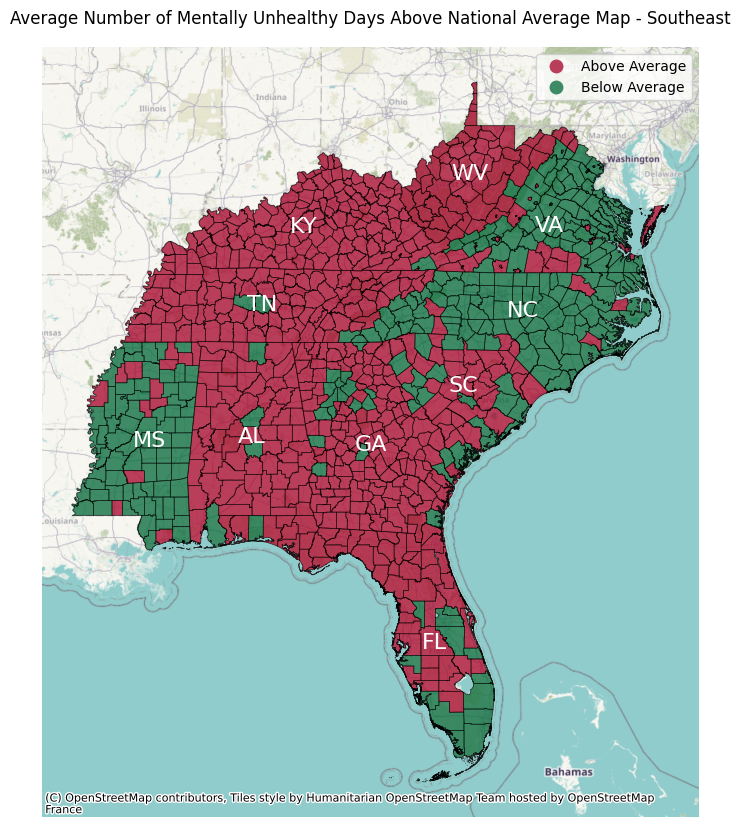

In [330]:
fig, ax = plt.subplots(figsize=(15,10))

gis_23 = shape_county_merged_southeast[shape_county_merged_southeast.STATE.str.contains(southeast_states_filter)].plot(column = 'Mentally_Unhealthy_Days_mean_indicator',
                                                                    
                                                                    legend = True, cmap = 'RdYlGn',
                                                                       ax=ax, edgecolor = 'k', linewidth = .5, alpha = .75)
for x, y, label in zip(x_coord, y_coord, abbrev):
    gis_23.text(x = x, y= y, s = label, fontsize = 16, ha = 'center', va = 'center', color = 'white')
gis_23.set_axis_off()
gis_23.set_title('Average Number of Mentally Unhealthy Days Above National Average Map - Southeast')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

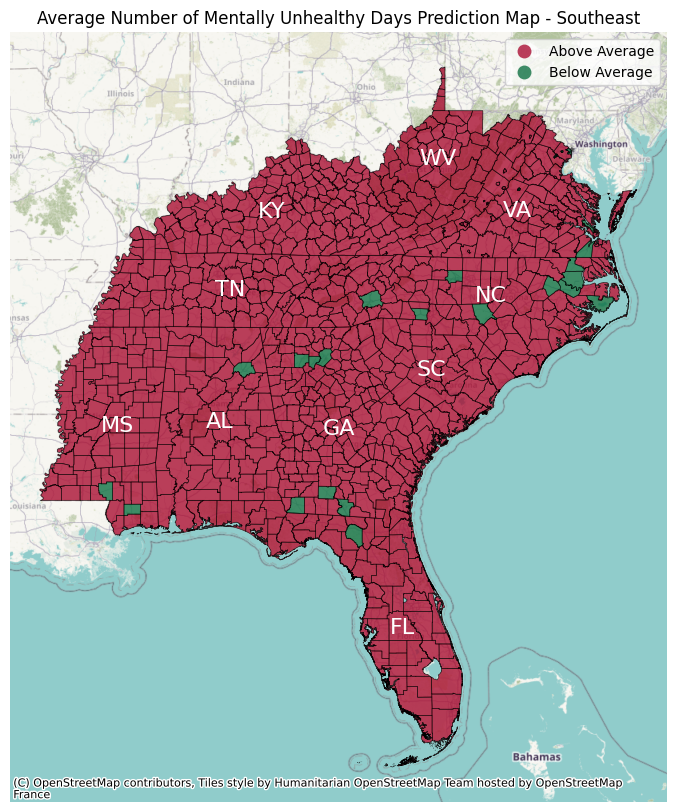

In [488]:
fig, ax = plt.subplots(figsize=(15,10))

gis_24 = shape_county_merged_southeast[shape_county_merged_southeast.STATE.str.contains(southeast_states_filter)].plot(column = 'SE_Mentally_Unhealthy_Predicted',
                                                                    
                                                                    legend = True, cmap= "RdYlGn",
                                                                       ax=ax, edgecolor = 'k', linewidth = .5, alpha = .75)
for x, y, label in zip(x_coord, y_coord, abbrev):
    gis_24.text(x = x, y= y, s = label, fontsize = 16, ha = 'center', va = 'center', color = 'white')
gis_24.set_axis_off()
gis_24.set_title('Average Number of Mentally Unhealthy Days Prediction Map - Southeast')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

In [345]:
shape_county_merged_southeast['SE_Mentally_Unhealthy_correct_prediction'] = shape_county_merged_southeast['SE_Mentally_Unhealthy_correct_prediction'].replace({True: "Correct", False: "Incorrect"})

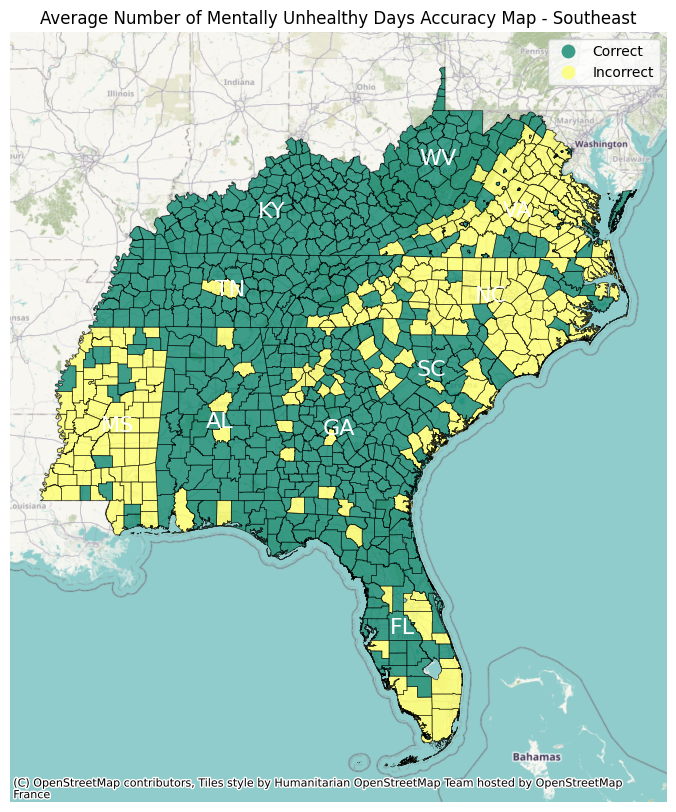

In [346]:
fig, ax = plt.subplots(figsize=(15,10))

gis_25 = shape_county_merged_southeast[shape_county_merged_southeast.STATE.str.contains(southeast_states_filter)].plot(column = 'SE_Mentally_Unhealthy_correct_prediction',
                                                                    
                                                                    legend = True, cmap = 'summer',
                                                                       ax=ax, edgecolor = 'k', linewidth = .5, alpha = .75)
for x, y, label in zip(x_coord, y_coord, abbrev):
    gis_25.text(x = x, y= y, s = label, fontsize = 16, ha = 'center', va = 'center', color = 'white')
gis_25.set_axis_off()
gis_25.set_title('Average Number of Mentally Unhealthy Days Accuracy Map - Southeast')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

In [423]:
#get percent correct for physical health by community type
small_urban_ment_perc_correct = shape_county_merged_southeast_filtered[(shape_county_merged_southeast_filtered.Community_Type =="Small Urban") & (shape_county_merged_southeast_filtered.SE_Mentally_Unhealthy_correct_prediction == "Correct")].shape[0]/shape_county_merged_southeast_filtered[(shape_county_merged_southeast_filtered.Community_Type =="Small Urban")].shape[0]
rural_ment_perc_correct = shape_county_merged_southeast_filtered[(shape_county_merged_southeast_filtered.Community_Type =="Rural") & (shape_county_merged_southeast_filtered.SE_Mentally_Unhealthy_correct_prediction == "Correct")].shape[0]/shape_county_merged_southeast_filtered[(shape_county_merged_southeast_filtered.Community_Type =="Rural")].shape[0]
urban_ment_perc_correct = shape_county_merged_southeast_filtered[(shape_county_merged_southeast_filtered.Community_Type =="Urban") & (shape_county_merged_southeast_filtered.SE_Mentally_Unhealthy_correct_prediction == "Correct")].shape[0]/shape_county_merged_southeast_filtered[(shape_county_merged_southeast_filtered.Community_Type =="Urban")].shape[0]

print("Rural Mental Health % Correct Predicted: " + str(rural_ment_perc_correct))
print("Small Urban Mental Health % Correct Predicted: " + str(small_urban_ment_perc_correct))
print("Urban Mental Health % Correct Predicted: " + str(urban_ment_perc_correct))

Rural Mental Health % Correct Predicted: 0.7408
Small Urban Mental Health % Correct Predicted: 0.5822784810126582
Urban Mental Health % Correct Predicted: 0.532258064516129
